<a href="https://colab.research.google.com/github/Ileshgattu/data-science-assignments/blob/main/Assignment_on_Text_Mining_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 1) Extract reviews of any product from ecommerce website like amazon
# 2) Perform emotion mining

In [ ]:
from google.colab import files
upload = files.upload()

Saving cleaned_reviews.csv to cleaned_reviews.csv


In [ ]:
import numpy as np
import string
import spacy
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from wordcloud import WordCloud
%matplotlib inline

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
df = pd.read_csv('cleaned_reviews.csv')
df

In [ ]:
df = df[['cleaned_review']]
df

In [ ]:
df = df.rename(columns={'cleaned_review':'x'})
df

In [ ]:
for i in df.x:
    print(i)

Streaming output truncated to the last 5000 lines.
i loved the cushioning very comfy on my ears
i just got it ll update after few weeks of using it 
these are heaven sent
excellent for call of duty
for gaming its good and the audio is amazing would recommend to friends 
best earphones ve purchased so far
my son loves the headset
great quality headset sounds great and the lights look great
use for my playstation it very comfortable sound is good
i needed new headset for both my work pc and for my ps this is the one my co workers can hear me loud and clear and my gf doesn throw things at me because she sleeping and the rats have eaten me again and don hear her snoring while stealthing my way through village very comfortable fit even on my giant noggin 
works great loud and clear 
i love this headset other than the type of microphone it has like bendy ones it awesome 
i love the flip down mic and sound canceling effect 
perfect for gaming and talking to friends in games 
some might like l

In [ ]:
df = [str(i).strip() for i in df.x]
df

['i wish would have gotten one earlier love it and it makes working in my laptop so much easier',
 'i ve learned this lesson again open the package and use the product right away ordered this mouse in august as my travel mouse and just packed it away in my bag now ve been visiting family in the pnw since mid september the mouse took charge and worked fine for couple of weeks after recharged the mouse it worked for day or two and then ceased to function the optical light will flash once when turned on then nothing of course the return window is well past',
 'it is so slow and lags find better option',
 'roller ball stopped working within months of minimal use piece of junk',
 'i like the color and size but it few days out of the return period and it will not hold charge',
 'overall love this mouse the size weight clicking is all fabulous however ve had two of these now and the middle scroller has randomly fallen in without rough use it wasn dropped literally was not even touching it the

In [42]:
df_text = ''.join(df)
df_text

'i wish would have gotten one earlier love it and it makes working in my laptop so much easieri ve learned this lesson again open the package and use the product right away ordered this mouse in august as my travel mouse and just packed it away in my bag now ve been visiting family in the pnw since mid september the mouse took charge and worked fine for couple of weeks after recharged the mouse it worked for day or two and then ceased to function the optical light will flash once when turned on then nothing of course the return window is well pastit is so slow and lags find better optionroller ball stopped working within months of minimal use piece of junki like the color and size but it few days out of the return period and it will not hold chargeoverall love this mouse the size weight clicking is all fabulous however ve had two of these now and the middle scroller has randomly fallen in without rough use it wasn dropped literally was not even touching it the second time and heard it 

In [ ]:
no_punc_text = df_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

In [ ]:
from nltk.tokenize import TweetTokenizer
tokens = TweetTokenizer(strip_handles=True)
tweet_tokens = tokens.tokenize(no_punc_text)
print(tweet_tokens[0:50])

['i', 'wish', 'would', 'have', 'gotten', 'one', 'earlier', 'love', 'it', 'and', 'it', 'makes', 'working', 'in', 'my', 'laptop', 'so', 'much', 'easieri', 've', 'learned', 'this', 'lesson', 'again', 'open', 'the', 'package', 'and', 'use', 'the', 'product', 'right', 'away', 'ordered', 'this', 'mouse', 'in', 'august', 'as', 'my', 'travel', 'mouse', 'and', 'just', 'packed', 'it', 'away', 'in', 'my', 'bag']


In [ ]:
# remove http or any url within the text
import re
no_url_text = re.sub(r'http\S+',' ',no_punc_text)
no_url_text

'i wish would have gotten one earlier love it and it makes working in my laptop so much easieri ve learned this lesson again open the package and use the product right away ordered this mouse in august as my travel mouse and just packed it away in my bag now ve been visiting family in the pnw since mid september the mouse took charge and worked fine for couple of weeks after recharged the mouse it worked for day or two and then ceased to function the optical light will flash once when turned on then nothing of course the return window is well pastit is so slow and lags find better optionroller ball stopped working within months of minimal use piece of junki like the color and size but it few days out of the return period and it will not hold chargeoverall love this mouse the size weight clicking is all fabulous however ve had two of these now and the middle scroller has randomly fallen in without rough use it wasn dropped literally was not even touching it the second time and heard it 

In [ ]:
#remove stopwords
import nltk
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
my_stop_words = stopwords.words('english')
my_stop_words.append('the')
no_stop_tokens = [word for word in tweet_tokens if not word in my_stop_words]
no_stop_tokens[0:50]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


['wish',
 'would',
 'gotten',
 'one',
 'earlier',
 'love',
 'makes',
 'working',
 'laptop',
 'much',
 'easieri',
 'learned',
 'lesson',
 'open',
 'package',
 'use',
 'product',
 'right',
 'away',
 'ordered',
 'mouse',
 'august',
 'travel',
 'mouse',
 'packed',
 'away',
 'bag',
 'visiting',
 'family',
 'pnw',
 'since',
 'mid',
 'september',
 'mouse',
 'took',
 'charge',
 'worked',
 'fine',
 'couple',
 'weeks',
 'recharged',
 'mouse',
 'worked',
 'day',
 'two',
 'ceased',
 'function',
 'optical',
 'light',
 'flash']

In [ ]:
# normalizing the data
lower_words = [words.lower() for words in no_stop_tokens]
lower_words

['wish',
 'would',
 'gotten',
 'one',
 'earlier',
 'love',
 'makes',
 'working',
 'laptop',
 'much',
 'easieri',
 'learned',
 'lesson',
 'open',
 'package',
 'use',
 'product',
 'right',
 'away',
 'ordered',
 'mouse',
 'august',
 'travel',
 'mouse',
 'packed',
 'away',
 'bag',
 'visiting',
 'family',
 'pnw',
 'since',
 'mid',
 'september',
 'mouse',
 'took',
 'charge',
 'worked',
 'fine',
 'couple',
 'weeks',
 'recharged',
 'mouse',
 'worked',
 'day',
 'two',
 'ceased',
 'function',
 'optical',
 'light',
 'flash',
 'turned',
 'nothing',
 'course',
 'return',
 'window',
 'well',
 'pastit',
 'slow',
 'lags',
 'find',
 'better',
 'optionroller',
 'ball',
 'stopped',
 'working',
 'within',
 'months',
 'minimal',
 'use',
 'piece',
 'junki',
 'like',
 'color',
 'size',
 'days',
 'return',
 'period',
 'hold',
 'chargeoverall',
 'love',
 'mouse',
 'size',
 'weight',
 'clicking',
 'fabulous',
 'however',
 'two',
 'middle',
 'scroller',
 'randomly',
 'fallen',
 'without',
 'rough',
 'use',
 'dro

In [ ]:
# Stemming
from nltk.stem import PorterStemmer
ps = PorterStemmer()
stemmed_tokens = [ps.stem(word) for word in lower_words]
print(stemmed_tokens[0:50])

In [ ]:
! python -m spacy download en_core_web_sm

In [ ]:
! python -m spacy download en_core_web_lg

2023-05-29 16:36:13.481445: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [ ]:
import en_core_web_sm
nlp = en_core_web_sm.load()

In [ ]:
doc = (' '.join(no_stop_tokens))
doc

'wish would gotten one earlier love makes working laptop much easieri learned lesson open package use product right away ordered mouse august travel mouse packed away bag visiting family pnw since mid september mouse took charge worked fine couple weeks recharged mouse worked day two ceased function optical light flash turned nothing course return window well pastit slow lags find better optionroller ball stopped working within months minimal use piece junki like color size days return period hold chargeoverall love mouse size weight clicking fabulous however two middle scroller randomly fallen without rough use dropped literally even touching second time heard fall need use middle scroller lot recommend purchase use feature great mouseit stopped workingmy son uses school issued chromebook school work hates using touch pad navigate mouse looked wireless mouse found one many good reviews unfortunately scrolling wheel already broken used month since uses school computer mostly stayed sto

In [ ]:
import spacy
nlp = spacy.load('en_core_web_lg',disable=['parser', 'tagger','ner'])
nlp.max_length = 200000000

In [ ]:
obj = nlp(doc)
lemmas = [token.lemma_ for token in obj]
print(lemmas[0:100])

In [ ]:
final_tweets = ' '.join(lemmas)
final_tweets

In [ ]:
#Feature Extraction
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
x = vectorizer.fit_transform(lemmas)
print(vectorizer.vocabulary_)

In [ ]:
print(vectorizer.get_feature_names_out()[0:50])
print(x.toarray())

In [ ]:
print(x.toarray().shape)

In [ ]:
# CountVectorizer Bigrams and Trigrams
vectorizer_ngram_range = CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram = vectorizer_ngram_range.fit_transform(lemmas)

In [ ]:
print(vectorizer_ngram_range.get_feature_names_out()[0:50])
print(bow_matrix_ngram.toarray)

In [ ]:
print(bow_matrix_ngram.toarray().shape)

In [ ]:
# TFIDF VECTORIZER
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_ngram_max_features = TfidfVectorizer(analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram_max_features = vectorizer_ngram_max_features.fit_transform(lemmas)

In [ ]:
print(vectorizer_ngram_max_features.get_feature_names_out()[0:50])
print(tfidf_matrix_ngram_max_features.toarray())

In [ ]:
# Generation of WordCloud
from wordcloud import WordCloud, STOPWORDS
#define a function to plot word cloud
def plot_cloud(wordcloud):
  #set fig size
  plt.figure(figsize=(40,30))
  #display image
  plt.imshow(wordcloud)
  # no axis details
  plt.axis('off');

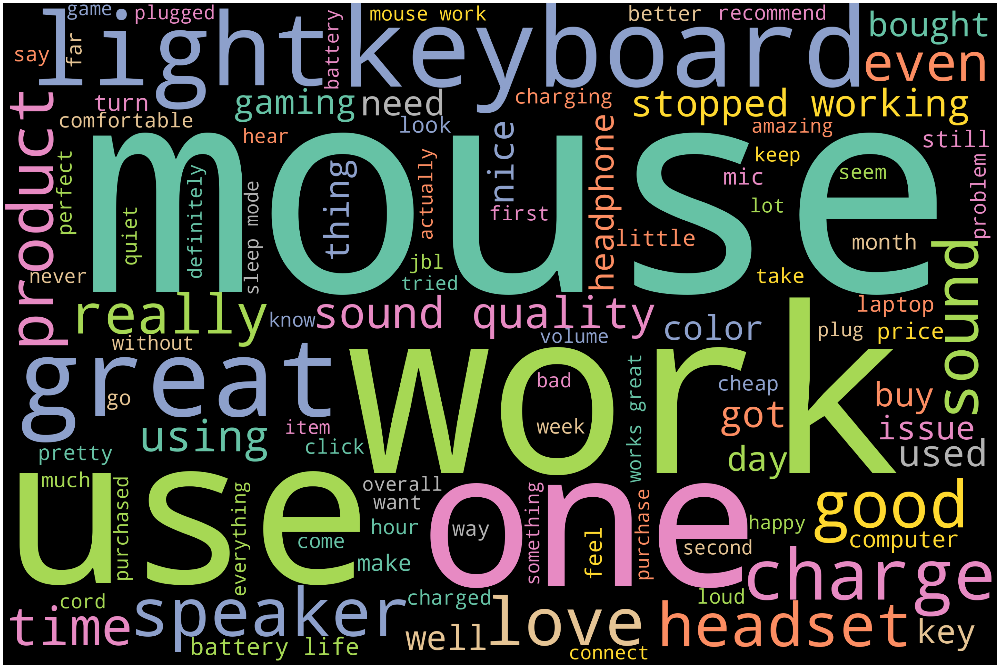

In [ ]:
stopwords = STOPWORDS
stopwords.add('will')
wordcloud = WordCloud(width=3000,height=2000,background_color='black',max_words=100,colormap='Set2',stopwords=stopwords).generate(final_tweets)
plot_cloud(wordcloud)

In [ ]:
# Named Entity Recognition
# Parts of speech Tagging
nlp = spacy.load('en_core_web_sm')
one_block = final_tweets
doc_block = nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [34]:
all_ents = []
for word in doc_block.ents:
    
    all_ents.append(word.label_)
set(all_ents)

{'CARDINAL',
 'DATE',
 'EVENT',
 'FAC',
 'GPE',
 'LANGUAGE',
 'LOC',
 'MONEY',
 'NORP',
 'ORDINAL',
 'ORG',
 'PERCENT',
 'PERSON',
 'PRODUCT',
 'QUANTITY',
 'TIME',
 'WORK_OF_ART'}

In [35]:
doc_block = nlp(one_block)
for token in doc_block[:]:
    print(token,"==>",token.pos_)

Streaming output truncated to the last 5000 lines.
stanmore ==> PROPN
hooked ==> ADJ
phone ==> NOUN
computer ==> NOUN
rocked ==> VERB
find ==> VERB
old ==> ADJ
bose ==> PROPN
acoustic ==> ADJ
wave ==> NOUN
mint ==> NOUN
condition ==> NOUN
amazing ==> ADJ
speaker ==> NOUN
hope ==> PROPN
review ==> NOUN
helps ==> VERB
thanks ==> NOUN
reading ==> VERB
itcrisp ==> PROPN
clean ==> ADJ
sound ==> NOUN
throughout ==> ADP
ranges ==> NOUN
sounds ==> VERB
awesome ==> ADV
pleased ==> ADJ
speakerdon ==> PROPN
know ==> PROPN
battery ==> PROPN
longi ==> PROPN
recommend ==> VERB
itas ==> VERB
far ==> ADV
portable ==> ADJ
bt ==> PROPN
speakers ==> NOUN
go ==> VERB
job ==> NOUN
music ==> NOUN
comes ==> VERB
sounds ==> VERB
pretty ==> ADV
clear ==> ADV
loud ==> ADJ
enough ==> ADJ
small ==> ADJ
outdoor ==> ADJ
area ==> NOUN
keep ==> VERB
pool ==> NOUN
side ==> NOUN
link ==> NOUN
together ==> ADV
stereo ==> ADJ
sound ==> ADJ
good ==> ADJ
way ==> NOUN
music ==> NOUN
pool ==> NOUN
area ==> NOUN
without ==> A

In [36]:
# Filtering for nouns and verbs only
nouns_verbs = [token.text for token in doc_block if token.pos_ in ('NOUN', 'VERB')]
print(nouns_verbs[1:100])

['gotten', 'love', 'makes', 'working', 'laptop', 'learned', 'lesson', 'package', 'use', 'product', 'ordered', 'mouse', 'packed', 'bag', 'visiting', 'family', 'pnw', 'took', 'charge', 'worked', 'couple', 'weeks', 'recharged', 'mouse', 'worked', 'day', 'ceased', 'function', 'light', 'flash', 'turned', 'course', 'return', 'window', 'pastit', 'lags', 'find', 'ball', 'stopped', 'working', 'months', 'use', 'piece', 'junki', 'color', 'size', 'days', 'return', 'period', 'hold', 'chargeoverall', 'size', 'weight', 'clicking', 'scroller', 'fallen', 'use', 'dropped', 'touching', 'time', 'heard', 'fall', 'need', 'use', 'scroller', 'lot', 'recommend', 'purchase', 'use', 'feature', 'stopped', 'son', 'uses', 'school', 'issued', 'chromebook', 'school', 'work', 'hates', 'using', 'touch', 'pad', 'looked', 'mouse', 'found', 'reviews', 'scrolling', 'wheel', 'broken', 'month', 'uses', 'school', 'computer', 'stored', 'carrying', 'case', 'stored', 'use', 'loved']


In [37]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

X = cv.fit_transform(nouns_verbs)
sum_words = X.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq = sorted(words_freq,key=lambda x:x[1],reverse=True)
wf_df = pd.DataFrame(words_freq)
wf_df.columns = ['word','count']
wf_df

,word,count
0,mouse,4036
1,use,3111
2,work,2393
3,charge,2310
4,quality,1869
...,...,...
11560,whew,1
11561,settling,1
11562,coolomg,1
11563,debated,1


<Axes: title={'center': 'Top verbs and nouns'}, xlabel='word'>

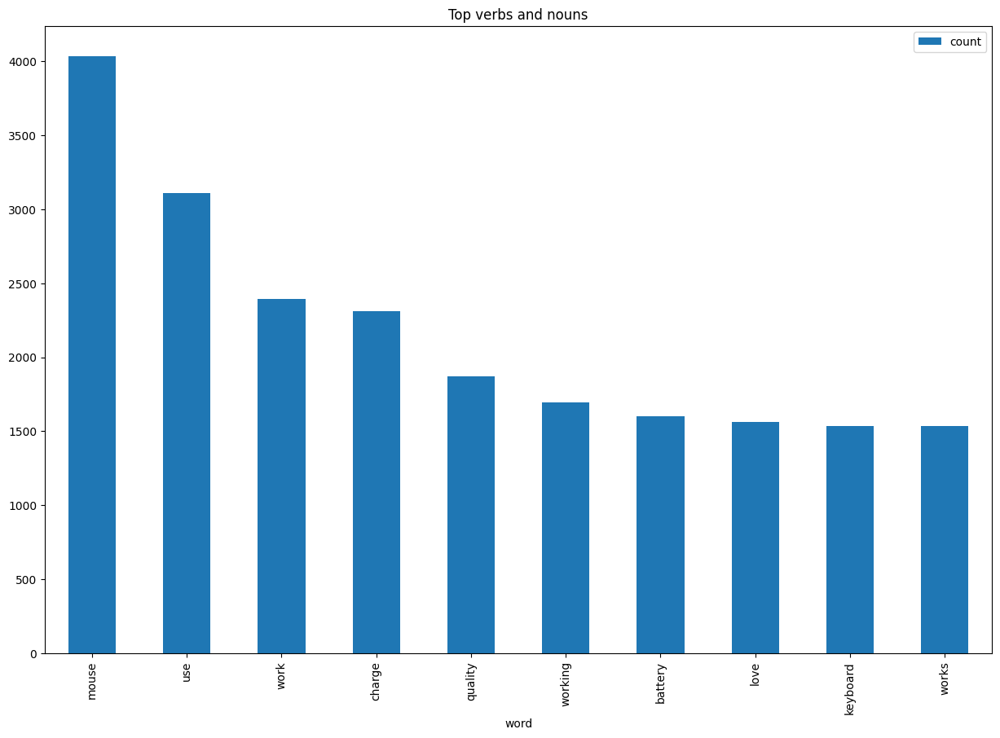

In [38]:
wf_df[0:10].plot.bar(x='word',figsize=(15,10),title='Top verbs and nouns')

In [39]:
# Emotional Mining - Sentimental Analysis

In [40]:
from nltk import tokenize
sentence = tokenize.sent_tokenize(''.join(df))
sentence

['i wish would have gotten one earlier love it and it makes working in my laptop so much easieri ve learned this lesson again open the package and use the product right away ordered this mouse in august as my travel mouse and just packed it away in my bag now ve been visiting family in the pnw since mid september the mouse took charge and worked fine for couple of weeks after recharged the mouse it worked for day or two and then ceased to function the optical light will flash once when turned on then nothing of course the return window is well pastit is so slow and lags find better optionroller ball stopped working within months of minimal use piece of junki like the color and size but it few days out of the return period and it will not hold chargeoverall love this mouse the size weight clicking is all fabulous however ve had two of these now and the middle scroller has randomly fallen in without rough use it wasn dropped literally was not even touching it the second time and heard it

In [41]:
sentence_df = pd.DataFrame(sentence,columns=['sentence'])
sentence_df

,sentence
0,i wish would have gotten one earlier love it a...
